<a href="https://colab.research.google.com/github/kpr-03/machine_learning/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # 🐶 End-to-end Multi-Class Dog Breed Classification

 This notebook builds and end to end  multi class image classifier using TensorFlow 2.O and TensorFlow Hub.

 ## 1. Problem
 Identifying the breed of a dog given an image of dog.

 When I'm sitting  at the cafe and I take a photo of a dog,I want to know what breed of dog it is.

 ## 2. Data
 The data we're using is from kaggle's dog breed identification competition.

 https://www.kaggle.com/competitions/dog-breed-identification/data

 ## 3. Evaluation

 The evaluation is a file with prediction probabilities for each dog breed of each test image.

 https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

 ## 4.Features
 Some information about the data:
 * We're dealing with images(unstructured data) so it's probably we use deep learning/transfer learning.
 * There are 120 breeds of dogs (this means there are 120 different classes)

 * There are around 10,000+ images in traing set(these images have labels).
 * There are around 10,000+ images in test set(these images have no labels,beacuse we'll want to predict them.


In [1]:
# unzip the folder in google drive.
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

## Get our Worksapce ready
* import tensorFlow 2.x ✅
* Import tensorFlow Hub ✅
* make sure we're using a GPU ✅

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF version:",hub.__version__)

# check for GPU availability.
print("GPU","available(YES!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF version: 0.13.0
GPU not available


In [3]:
# import TF 2.x
#try:
  # %tensorflow_version only in colab.
 # %tensorflow_version 2.x 
#except Exception:
 # pass

## Getting our data ready( turning into Tensors)
With all machine learning models,our data has to be in numerical format.

In [4]:
# accessing our data
import pandas as pd
labels_csv =pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

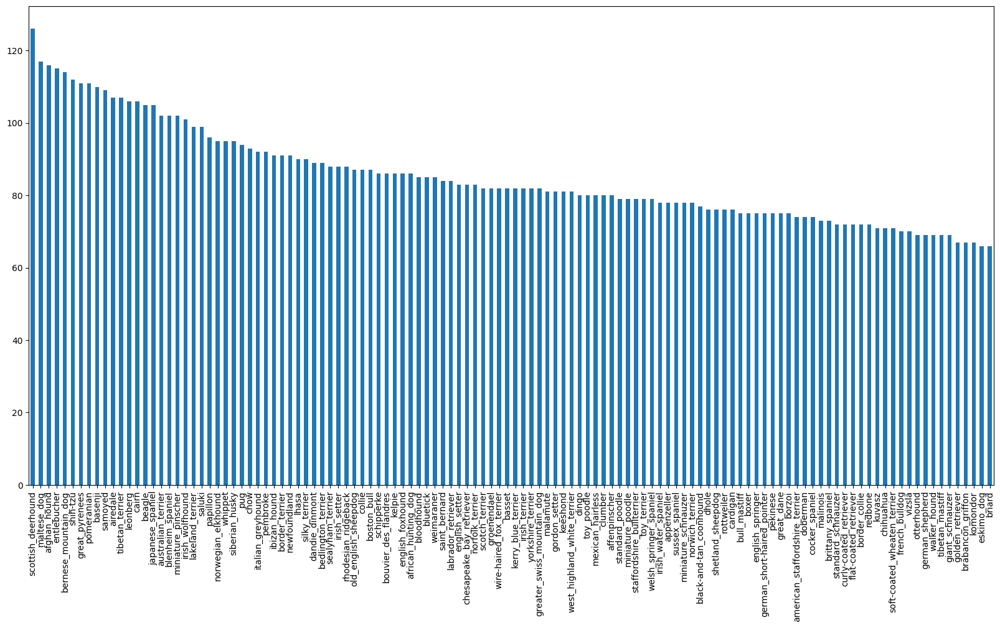

In [6]:
# how manay images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [7]:
labels_csv["breed"].value_counts().median()

82.0

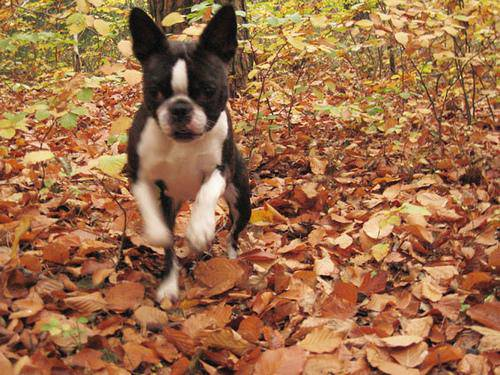

In [8]:
# Let's view an image
from IPython.display import Image 
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
Let's get list of all our image file pathnames

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathnames from Image's Id
filenames= ["drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]

# check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# check whether number of files matches with number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train"))==len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files,check the target directory")

Filenames match actual amount of files!!! Proceed.


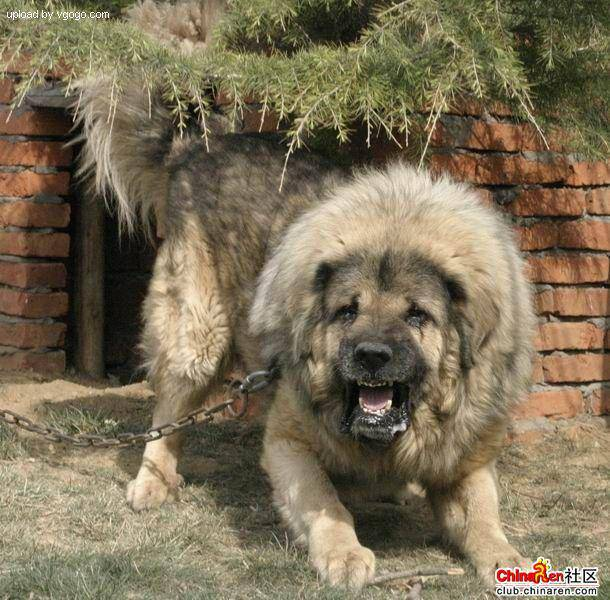

In [12]:
# One more check
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've got or training image filepaths in a lisy,let's prepare our labels

In [14]:
import numpy as np
labels= labels_csv["breed"].to_numpy()
#labels =np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches actual number of filenames
if len(labels)== len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels doesnot match number of filenames,check data directores")

Number of labels matches number of filenames


In [17]:
# find the unique lable values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
# Turn a single label into ana rray of boolenas
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
len(labels)

10222

In [21]:
# turn every label into a boolean arrya
boolean_labels =[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Example turning boolean arrays into integers
print(labels[0]) #original label
print(np.where(unique_breeds ==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [25]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set.
Since the data set from kaggle doesn't come with a validating set,we're going to create our own.

In [26]:
# Setup X and y variables
X =  filenames
y=boolean_labels

In [27]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [28]:
# set the number of images to use for experimenting
NUM_IMAGES = 6000 # @param {type:"slider",min:1000,max:10000,step:1000}

In [29]:
# Lets's split our data into train and validation
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size = 0.2,
                                                 random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(4800, 4800, 1200, 1200)

In [30]:
# let's have a geez at the training data
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog Vision/train/60e3ba241646a432f7cb58490ee36dbb.jpg',
  'drive/MyDrive/Dog Vision/train/8dfc43ad52aae79f3a05d46fce633692.jpg',
  'drive/MyDrive/Dog Vision/train/2b78075f0f8cca467507ca475610b762.jpg',
  'drive/MyDrive/Dog Vision/train/3a541ec3eb3e077d72acf2f3a28c2148.jpg',
  'drive/MyDrive/Dog Vision/train/4a0b6a56529c5b69b924b47d92b745e2.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images(turning images into tensor)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. use TenserFlow to read the file and save it to variable `image`

3. Resize the `image` to be a shape of (224,224)

4. Resize the image to be a shape of (224,224)

5.Return the modified `image`

Before we do,let's see what  importing an image looks like

In [31]:
# convert the image to Numpy Array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [32]:
image.max(),image.min()

(255, 0)

In [33]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [34]:
# turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what ana image looks like as a Tensor,let's make a function to preprocess them.

1. Take an image filepath as input

2. use TenserFlow to read the file and save it to variable image

3. Resize the image to be a shape of (224,224)
4. Normalize our image(convert color channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224,224)

6. Return the modified `image`

In [35]:
# define image size
IMG_SIZE = 224

# create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into Tensor

  """

  # read in an image file
  image = tf.io.read_file(image_path)
  # turn jpeg image to numerical tensor with 3 color channels(Red,Green,Blue)
  image = tf.io.decode_jpeg(image,channels =3)
  # convert the color channel values from 0-255 to 0-1 values
  image  = tf.image.convert_image_dtype(image,tf.float32)
  # resize the image to our desired value
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  return image


In [36]:
#tensor = tf.io.read_file(filenames[:26])

In [37]:
#tensor = tf.image.decode_jpeg(tensor,channels=3)

In [38]:
#tf.image.convert_image_dtype(tensor,tf.float32)

## Turning our data into batches

Why turn our data into batches?
Let's say you're trying to process 10,000+ images in one go...they all might not fit into memeory.

So,that's why we do about 32(this is the bqatch size) images at a time (you can manually adjust the batch size if needed)
In order to use TensorFlow effectively,we need our data in the form of Tensor tuples which looks like this:(`image`,`label`)

In [39]:
# create asimple function to return a tuple(image,label)
def get_image_label(image_path,label):
  """ 
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label)
  """
  image =process_image(image_path)
  return image,label

In [40]:
# Demo of above
(process_image(filenames[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form : `(image,label)`,let's make a function to turn all of our data into batches!

In [41]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch
    

In [42]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [43]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
our data is now in batches,however,these can be a little hard to understand/comprehend,let's visualize the data

In [44]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

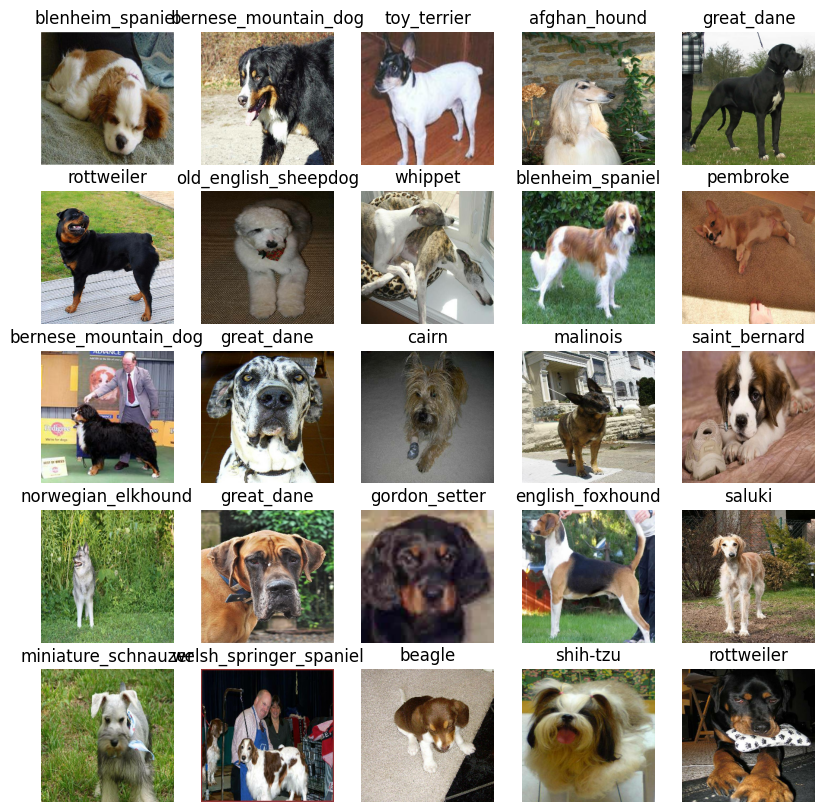

In [45]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

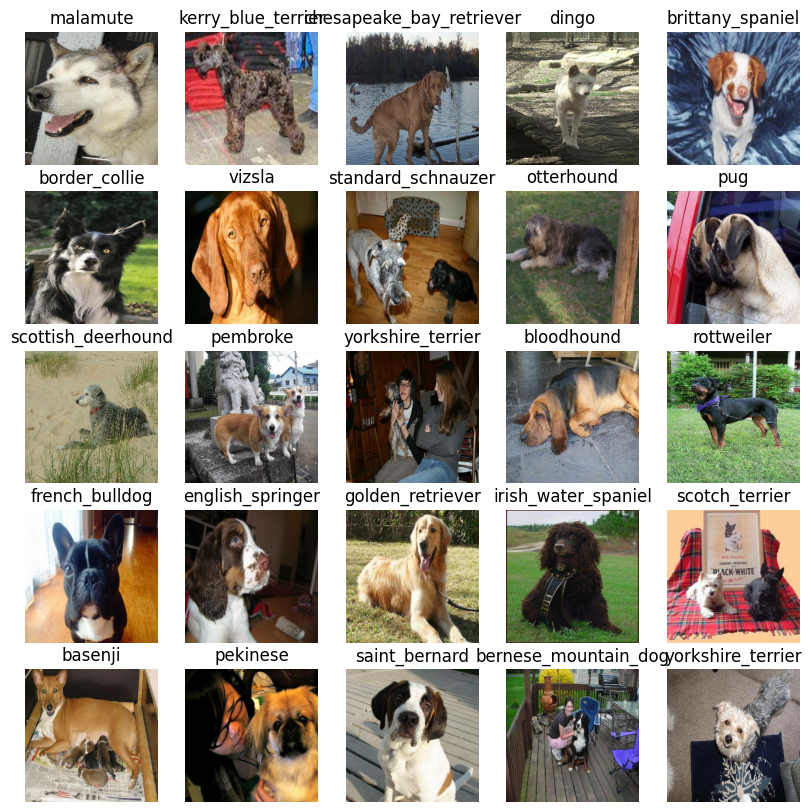

In [46]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before we build a model, there are a few things we need to define:
* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [47]:
# setup input shape to the model
INPUT_SHAPE =[None,IMG_SIZE,IMG_SIZE,3] # batch,height,width,colour channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

## setup model url from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs,outputs and model ready to go.
Let's put them together into a Keras deep learning model

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.

All of these steps can be found here:https://www.tensorflow.org/guide/keras

In [48]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [49]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
claabacks are helper functions a model can use during training to do such things as save its progress,check its progress or stop training early if a model stops improving.

We'll create two callbacks,one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.

## TensorBoard Callback

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function 

In [50]:
# load TensorBoard notebook extension
%load_ext tensorboard

In [51]:
import datetime

# create a function to build TensorBoard Callback
def create_tensorboard_callback():
  #create a log directory for sorting TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # MAke it so the logs get tracked whwnever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if certain evaluation metrics stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [52]:
# create early stopping call back
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience =3)

## Training a model(on subset of data)
Our first model is only going to train on 1000 images,to make sure everything is working

In [53]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [54]:
# check to make sure we're still running GPU
print("GPU","Available(YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available" )

GPU not available


let's create a function which trains a model
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [55]:
# build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # create a model
  model = create_model()

  # create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  # return the fitted model
  return model

In [56]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
150/150 [==============================] - 690s 4s/step - loss: 1.9643 - accuracy: 0.5515 - val_loss: 0.8856 - val_accuracy: 0.7517
Epoch 2/100
150/150 [==============================] - 402s 3s/step - loss: 0.4581 - accuracy: 0.8808 - val_loss: 0.7572 - val_accuracy: 0.7775
Epoch 3/100
150/150 [==============================] - 455s 3s/step - loss: 0.2419 - accuracy: 0.9500 - val_loss: 0.7111 - val_accuracy: 0.7850
Epoch 4/100
150/150 [==============================] - 401s 3s/step - loss: 0.1460 - accuracy: 0.9767 - val_loss: 0.7189 - val_accuracy: 0.7858
Epoch 5/100
150/150 [==============================] - 405s 3s/step - loss: 0.0955 - accuracy: 0.9881 - val_loss: 0.7224 - val_accuracy: 0.7842
Epoch 6/100
150/150 [==============================] - 401s 3s/step - loss: 0.0681 - accuracy: 0.9950 - val_loss: 0.7182 - val_accuracy: 0.7825
Epoch 7/100
150/150 [======================

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

**Note:** Overfitting to begin with is a good thing. It means our model is learning something.

# Checking the TensorBoard logs
The TensorBoard magic function(`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [57]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs --port=8008

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [58]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [59]:
# MAke predictions on the validtion data (not tused to train on)
predictions = model.predict(val_data,verbose=1)
predictions

38/38 [==============================] - 117s 2s/step


array([[1.5918787e-06, 1.2149201e-05, 1.3321082e-04, ..., 2.0405457e-06,
        8.4677949e-06, 1.2197532e-05],
       [8.6893525e-04, 5.3853792e-04, 2.1947622e-05, ..., 8.3948129e-05,
        3.7951232e-03, 1.0334249e-04],
       [1.2172816e-07, 8.1560295e-08, 7.3368746e-08, ..., 8.2296663e-04,
        3.4490316e-07, 1.5059243e-07],
       ...,
       [2.2937533e-07, 6.7635540e-07, 4.6938915e-08, ..., 1.7046370e-06,
        2.7444339e-05, 3.3284014e-06],
       [1.5589118e-05, 1.5511460e-04, 1.8611772e-07, ..., 7.8370294e-07,
        1.0029910e-06, 1.4021057e-06],
       [3.4232880e-08, 6.9344532e-07, 6.1503385e-07, ..., 1.0005884e-05,
        3.7513371e-04, 7.6865483e-08]], dtype=float32)

In [60]:
predictions.shape

(1200, 120)

In [61]:
len(y_val)

1200

In [62]:
len(unique_breeds)

120

In [63]:
np.sum(predictions[0])

1.0

In [64]:
# First prediction
index =42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[index])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[index])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}") # the predicted label

[2.17409579e-05 4.76134517e-07 1.85713716e-07 2.61538048e-06
 2.74199992e-05 2.81768689e-06 2.71340230e-08 2.62433389e-07
 3.46357552e-07 1.99243095e-05 7.28973318e-05 1.55172456e-05
 8.38532742e-07 2.36611436e-06 2.80144320e-07 3.75778495e-06
 3.35342725e-06 1.22596088e-04 3.64468433e-05 3.72093655e-06
 3.31838169e-06 3.15044986e-07 1.30291014e-07 1.62104106e-06
 1.17104861e-03 3.99037017e-05 5.25794349e-07 1.29598834e-06
 7.99264252e-01 8.06889511e-06 6.13311422e-04 3.40992701e-05
 1.17143554e-06 3.20139334e-05 5.40102832e-02 3.86767454e-08
 4.88920887e-06 7.24962320e-06 1.07798633e-05 1.26949828e-06
 2.95631162e-06 1.14271415e-05 1.13543103e-06 2.67211976e-06
 3.67714470e-04 2.34413790e-07 4.74414173e-06 6.09048991e-04
 1.57738777e-05 3.72840150e-04 5.98928921e-07 3.13466553e-05
 2.25976737e-06 2.99829958e-06 1.02047770e-05 1.57557383e-06
 2.18414061e-06 1.14415123e-07 3.20207299e-04 4.06156914e-06
 2.78077823e-06 4.77887534e-06 1.39110068e-06 2.15684977e-05
 3.03044749e-06 3.004836

In [65]:
unique_breeds[28]

'chesapeake_bay_retriever'

aving this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

**Note:** Prediction probabilities are also known as confidence levels.

In [66]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'groenendael'

Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`]
(https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

In [67]:

val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [68]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.1374825 , 0.1374825 , 0.1374825 ],
         [0.15449055, 0.15449055, 0.15449055],
         [0.16105567, 0.16105567, 0.16105567],
         ...,
         [0.18919839, 0.18527682, 0.16959055],
         [0.19606169, 0.19214012, 0.17645383],
         [0.18955702, 0.18563545, 0.16994916]],
 
        [[0.13132879, 0.13132879, 0.13132879],
         [0.14182213, 0.14182213, 0.14182213],
         [0.14856794, 0.14856794, 0.14856794],
         ...,
         [0.18386397, 0.1799424 , 0.16425613],
         [0.18941917, 0.18549758, 0.16981131],
         [0.18069911, 0.17677754, 0.16109127]],
 
        [[0.13364847, 0.13364847, 0.13364847],
         [0.1376138 , 0.1376138 , 0.1376138 ],
         [0.14665031, 0.14665031, 0.14665031],
         ...,
         [0.17823601, 0.17431444, 0.15862817],
         [0.17714101, 0.17321944, 0.15753317],
         [0.16766444, 0.16374287, 0.1480566 ]],
 
        ...,
 
        [[0.33766976, 0.26517332, 0.19687328],
         [0.3017667 , 0.23857348, 0.18018

In [69]:
get_pred_label(predictions[0])

'malamute'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:
* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [70]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction,ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the colour of the title depending on f the prediction is right or wrong
  if pred_label == true_label:
    color ="green"
  else:
    color ="red"


  # change plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  

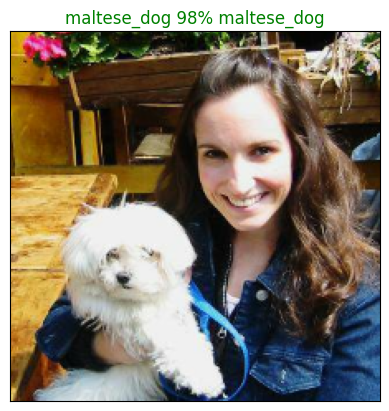

In [71]:
plot_pred(prediction_probabilities=predictions,
          labels =val_labels,
          images=val_images,
          n=97)

Let's build a function to demonstrate. The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [72]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # get the predicted label
  pred_label =get_pred_label(pred_prob)

   # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]


  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

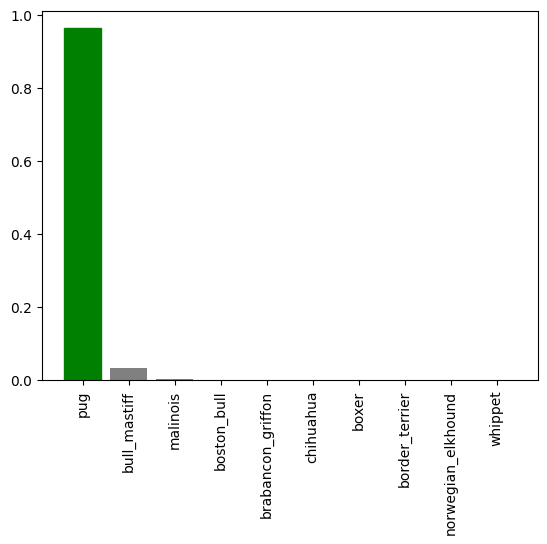

In [73]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [74]:
predictions[0]

array([1.59187869e-06, 1.21492012e-05, 1.33210822e-04, 6.33313994e-06,
       4.73923537e-05, 1.08465827e-06, 3.19082915e-06, 1.72905675e-05,
       7.00956571e-06, 1.51352840e-04, 1.12228627e-05, 5.58051852e-06,
       1.39213471e-05, 1.95825796e-05, 1.01010301e-04, 6.66258984e-07,
       1.13450342e-05, 9.46182190e-05, 3.08144845e-05, 1.53503424e-05,
       2.14951910e-06, 4.21058121e-06, 7.74076670e-06, 1.62173150e-04,
       1.48956451e-06, 1.78216433e-05, 1.10455085e-05, 2.14458341e-05,
       1.29957389e-05, 1.37934273e-06, 3.93580085e-05, 2.77747349e-05,
       5.73801481e-05, 4.31012404e-06, 3.12705720e-06, 1.08622507e-05,
       2.53772567e-04, 1.57440751e-04, 3.80811343e-06, 2.18997957e-06,
       1.73916715e-06, 5.86756778e-06, 2.33190614e-04, 2.90370017e-01,
       1.40875291e-05, 9.26263383e-05, 2.01562114e-04, 3.18025695e-06,
       4.81826755e-05, 2.13993335e-05, 1.81834930e-05, 2.05553733e-05,
       4.04878047e-05, 2.10751223e-05, 2.61122841e-05, 5.94744633e-05,
      

In [75]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([6.6137058e-01, 2.9037002e-01, 4.2978145e-02, 4.7685773e-04,
       3.9978858e-04, 3.1078857e-04, 2.7113772e-04, 2.5377257e-04,
       2.3319061e-04, 2.2067371e-04], dtype=float32)

In [76]:
predictions[0].max()

0.6613706

 Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

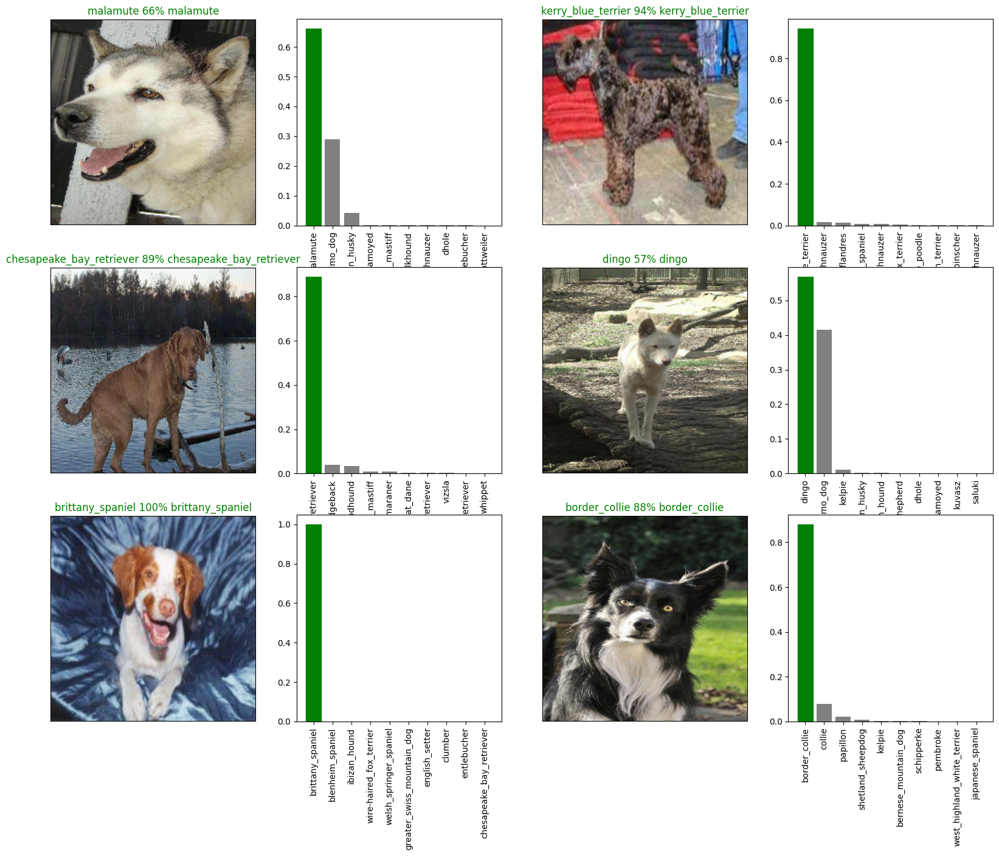

In [77]:
# let's check out a few predictions and their different values
i_multiplier = 0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  
plt.show()
  

### Saving and loading a trained model

In [78]:
# Create a functiuon to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d=%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save fromat of model
  print(f"Saving model to :{model_path}...")
  model.save(model_path)
  return model_path


In [79]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading a save model from:{model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [80]:
# save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog Vision/models/20230613=11401686656403-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230613=11401686656403-1000-images-mobilenetv2-Adam.h5'

In [81]:
# load a trained model
loaded_1000_image_model= load_model('drive/MyDrive/Dog Vision/models/20230613=07351686641701-1000-images-mobilenetv2-Adam.h5')

Loading a save model from:drive/MyDrive/Dog Vision/models/20230613=07351686641701-1000-images-mobilenetv2-Adam.h5...


In [82]:
# EVALUATE the pre-saved model
model.evaluate(val_data)

38/38 [==============================] - 77s 2s/step - loss: 0.7291 - accuracy: 0.7833


[0.7291240692138672, 0.7833333611488342]

In [83]:
# evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

38/38 [==============================] - 79s 2s/step - loss: 0.7229 - accuracy: 0.7925


[0.7229015827178955, 0.7925000190734863]

### Training a big dog model 🐶(on the full data)

In [84]:
len(X),len(y)

(10222, 10222)

In [85]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [86]:
len(X_train)

4800

In [87]:
# create a data batch with the full daata set
full_data = create_data_batches(X,y)

Creating training data batches...


In [88]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [89]:
# create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [90]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data,so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [91]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 653s 2s/step - loss: 1.3454 - accuracy: 0.6730
Epoch 2/100
320/320 [==============================] - 670s 2s/step - loss: 0.4008 - accuracy: 0.8792
Epoch 3/100
320/320 [==============================] - 701s 2s/step - loss: 0.2392 - accuracy: 0.9332
Epoch 4/100
320/320 [==============================] - 659s 2s/step - loss: 0.1544 - accuracy: 0.9641
Epoch 5/100
320/320 [==============================] - 664s 2s/step - loss: 0.1080 - accuracy: 0.9762
Epoch 6/100
320/320 [==============================] - 670s 2s/step - loss: 0.0761 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 666s 2s/step - loss: 0.0584 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 674s 2s/step - loss: 0.0459 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 695s 2s/step - loss: 0.0368 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 694s 2s/step - loss: 0.031

In [92]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog Vision/models/20230613=15231686669806-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230613=15231686669806-full-image-set-mobilenetv2-Adam.h5'

In [93]:
# loading the full model
loaded_full_model= load_model('drive/MyDrive/Dog Vision/models/20230613=08301686645021-full-image-set-mobilenetv2-Adam.h5')

Loading a save model from:drive/MyDrive/Dog Vision/models/20230613=08301686645021-full-image-set-mobilenetv2-Adam.h5...


In [94]:
len(X)

10222

### Making predictions on test dataset
 Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data,we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into tensor batches

To make predictions on testdata,we'll:
* Get the test image filenames
* convert the filename into test data batches using 'create_data_batcges()` and setting the `test_data` parameter to `True`(since tetsdata doest not have labels)
* Make predictions array by passing the test batches to the `predict()` method called on our model

In [95]:
# load test image filenames
test_path ="drive/MyDrive/Dog Vision/test/"
test_filenames =[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 'drive/MyDrive/Dog Vision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 'drive/MyDrive/Dog Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/Dog Vision/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'drive/MyDrive/Dog Vision/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 'drive/MyDrive/Dog Vision/test/e7ed96b272013c6de9505a753816ce75.jpg',
 'drive/MyDrive/Dog Vision/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog Vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/Dog Vision/test/e800b6c8d2904e205d67ada800907762.jpg']

In [96]:
len(test_filenames)

10357

In [97]:
# create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [98]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling `predict()` on our full model passing it the test data batch will take a long time to run(about~1hr)

In [99]:
# make predictions on test data batches using the loaded full model
test_predictions= loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 960s 3s/step


In [100]:
# save predictions(Numpy array) to csv file( for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [101]:
#Load predictions (NUmpy array) from csv file
test_predictions =np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",delimiter =",")

In [102]:
test_predictions[:10]

array([[1.64017379e-07, 2.00234899e-06, 6.06914966e-07, ...,
        1.95163057e-06, 2.43987053e-10, 5.27469659e-08],
       [5.80594204e-08, 4.77450995e-11, 6.74335979e-06, ...,
        9.61702273e-10, 3.98740729e-09, 2.90938033e-06],
       [4.27154356e-09, 8.42612924e-11, 1.60392011e-09, ...,
        4.22502522e-09, 3.04674175e-10, 9.39264777e-10],
       ...,
       [3.10507217e-16, 3.09239735e-14, 1.89593693e-15, ...,
        2.82853141e-13, 4.21582392e-14, 1.10233913e-16],
       [3.21740430e-07, 8.42899681e-06, 3.00358738e-09, ...,
        1.13051266e-08, 5.21459143e-08, 6.15782701e-05],
       [2.69283571e-11, 9.01886747e-13, 4.18940438e-10, ...,
        2.11291306e-04, 4.86134688e-08, 3.72285449e-12]])

In [103]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle

Looking at the [Kaggle sample submission](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:
*   Create a pandas DataFrame with an ID column as well as a column for each dog breed.
*   Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [104]:
# create a pandas DataFrame with empty columns
preds_df= pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [105]:
# append test image id's to predictions DataFrame
test_ids =[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [106]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7be7b911a4cba9fdfa4105ec4776370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7e9624f2a2e61ab187358f5968bfde8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7dc8cc599049ea9fa2a172c88646c57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7e9dd51302fe08c1c89a550e183cf07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [107]:
# Add the prediction probabilites to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7be7b911a4cba9fdfa4105ec4776370,1.640174e-07,2.002349e-06,6.069150e-07,1.859003e-07,2.261307e-10,1.219589e-08,5.871648e-11,4.146870e-10,6.642878e-10,...,9.195514e-10,1.623398e-11,5.885373e-11,3.112351e-09,9.195632e-11,6.708678e-11,6.917336e-10,1.951631e-06,2.439871e-10,5.274697e-08
1,e7ce78e874945f182a4f5149aa505b09,5.805942e-08,4.774510e-11,6.743360e-06,1.092433e-14,8.397769e-10,1.039309e-07,4.983608e-09,2.181597e-08,2.646035e-11,...,2.398047e-07,1.677570e-08,1.368060e-08,9.593672e-12,1.430489e-08,2.590950e-10,6.601592e-09,9.617023e-10,3.987407e-09,2.909380e-06
2,e7e9624f2a2e61ab187358f5968bfde8,4.271544e-09,8.426129e-11,1.603920e-09,8.150541e-12,6.998329e-09,2.614661e-09,4.655321e-11,8.925649e-09,7.558935e-09,...,4.674902e-09,9.731816e-09,1.628232e-08,2.922071e-09,2.822755e-11,1.773073e-07,9.672946e-10,4.225025e-09,3.046742e-10,9.392648e-10
3,e7dc8cc599049ea9fa2a172c88646c57,2.206007e-06,1.223525e-08,1.099018e-08,3.165677e-10,1.160341e-07,5.044570e-08,2.827464e-09,2.535558e-08,3.188935e-11,...,2.444487e-07,3.654192e-08,2.040972e-08,4.596007e-08,1.379424e-08,3.203906e-09,1.617101e-06,1.598098e-09,7.262840e-07,8.484462e-08
4,e7e9dd51302fe08c1c89a550e183cf07,3.856647e-04,3.456528e-08,1.950833e-08,4.494269e-07,2.931793e-07,6.479590e-09,4.277926e-02,9.740445e-08,1.343415e-09,...,1.257225e-07,1.027335e-03,5.521744e-09,2.015096e-10,2.859053e-09,5.675397e-09,9.341076e-06,8.273565e-08,6.227459e-07,9.445552e-01


In [108]:
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making Predictions on custom images
To make predictions on custom images we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

**Note:** To make predictions on custom images, I've uploaded pictures of my own to a directory located at `drive/My Drive/Data/dogs/` (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.

In [111]:
# get custom image filepaths 
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths =[custom_path + fname for fname in os.listdir(custom_path)]


In [112]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-1.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-2.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-3.jpeg']

In [113]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [114]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 820ms/step


In [115]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'lakeland_terrier', 'labrador_retriever']

In [116]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

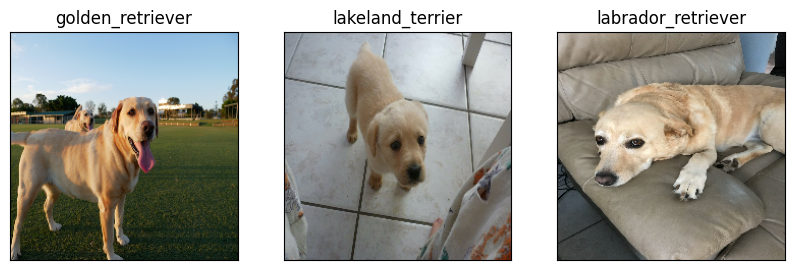

In [117]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)